In [39]:
% Setup path
clear

format compact

% ------------------------------------------------------------------------------
% BART TOOLBOX SETTINGS
addpath(fullfile('/home/bizon/bart-0.7.00', 'matlab'));
setenv('TOOLBOX_PATH', '/home/bizon/bart-0.7.00');
disp('BART Verson info:'); bart('version -V')
setenv('OMP_NUM_THREADS','30'); % set to number slightly smaller than number of physical cores

% Prevent AMD CPU from being throttled while using intel MKL libraries
setenv('MKL_DEBUG_CPU_TYPE','5');

% will need to update to point to the correct path
FS_dat_fullfilename = '/home/bizon/Research/MWI_Development/CALIPR/CALIPR_Publication_Share/CALIPR_Data/FS_dat.mat';


BART Verson info:
v0.7.00
GCC_VERSION=6.5.0 20181026
CUDA=1
ACML=0
FFTWTHREADS=1
OMP=1


In [2]:
%plot inline -w 2400 -h 1000 -r 300

% Note: not all languages may support the %plot magic, and not all
% options may be supported.

% Options:
% -------
% -h --height    Plot height in pixels
% -w --width     Plot width in pixels
% -r --resolution Resolution in pixels per inch
% -b --backend   Backend selection [default: inline]
% -f --format    Plot format (png, svg or jpg).
% -s --size      Pixel size of plots, "width,height"

# Set generic parameters for all

In [40]:
view_slice=23;
imscale = [ 0 1200 ];
TE = 5.7e-3; % echo time
nTE = 56; % echo train length
maxN_disp = 50; % maximum number of unique signal evolutions to display
thresh=1/6; % minimum threshold for signal intensity as fraction of maximum
show_threshold=1;
maxN = 25000000; % maximum number of unique signal evolutions to use for SVD
mkdir('SimulationResults/');
% ---------------------------------------------------

# Load and view data

In [41]:
load(FS_dat_fullfilename); size(FS_dat)

ans =
   240   200    50    56


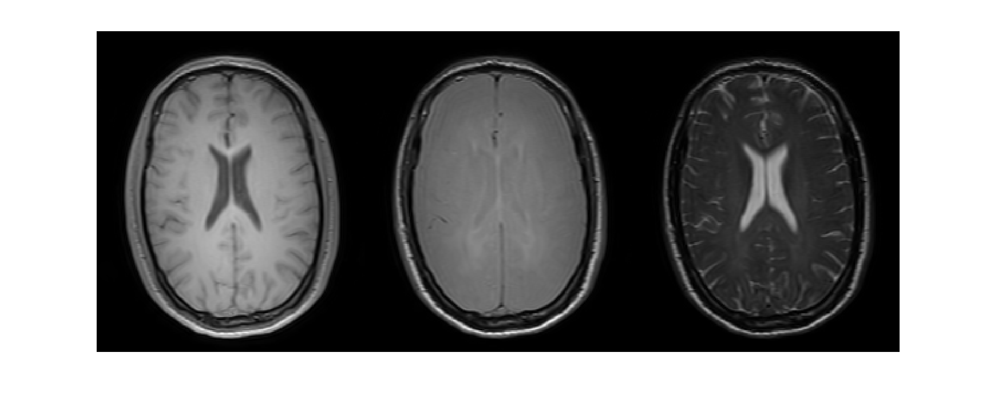

In [42]:
% use factor to roughly normalize windowing
figure(), imshow([ squeeze(abs(FS_dat(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat(:,:,view_slice,10))) 2*squeeze(abs(FS_dat(:,:,view_slice,28))) ], [])

# For original data, apply intensity threshold and use SVD to create the basis

ans =
  single
  300.5000
Length sig_evol < maxN)
Done Basis Set Calibration 
Total number of image voxels (for each echo time):
ans =
     2400000
Number of voxels (for each echo time) above intensity threshold:
ans =
     1031251


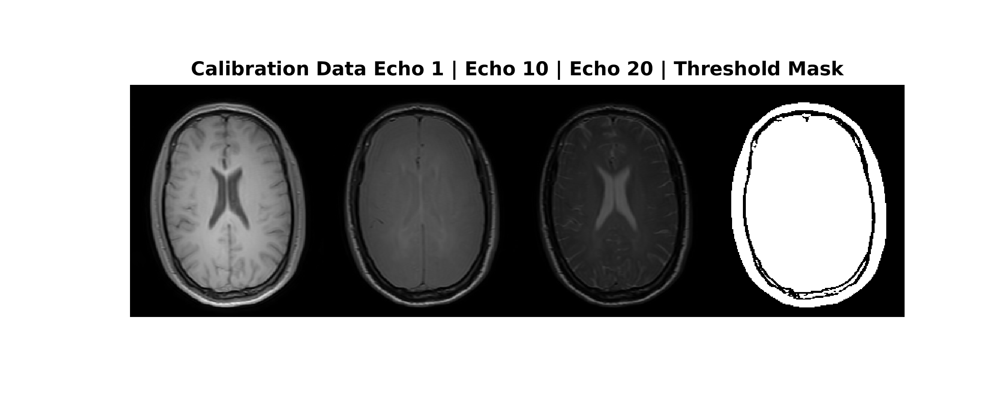

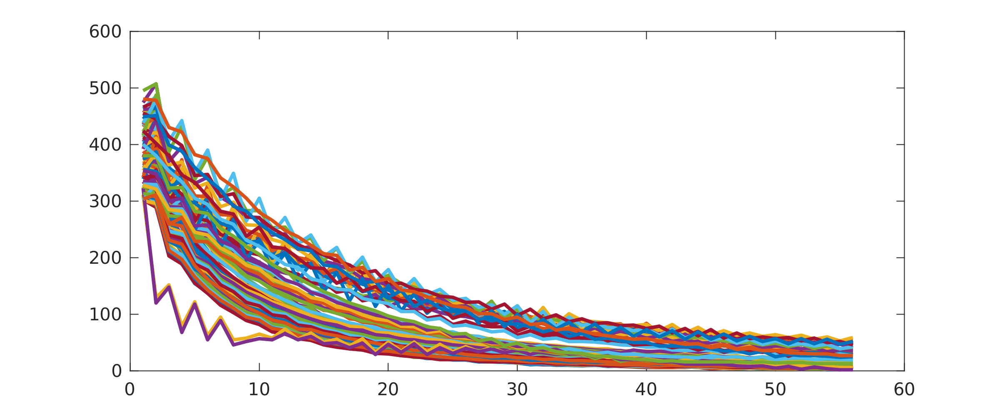

In [43]:
% ----------------- CREATE SIGNAL EVOLUTION MATRIX with column of all echo times, column of all voxels 
clear iflat_ALL tmp iflat sig_evol_ALL sig_evol sig_evol_disp datU
iflat_ALL = reshape(FS_dat, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(FS_dat,4));
% ----------------- 

% ----------------- remove threshold voxels
max(abs(iflat_ALL(:,1)))*thresh
tmp = squeeze(abs(iflat_ALL(:,1)));
% [ test thresh_indices ] = find( iflat_ALL(abs(iflat_ALL(:,1)) >= max(abs(iflat_ALL(:,1)))*thresh) );
thresh_indices = find( tmp >= max(tmp)*thresh);

iflat_ALL = iflat_ALL(thresh_indices,:);
% size(iflat_ALL)

sig_evol_ALL = permute(iflat_ALL, [ 2 1 ]); % rearrange for SVD
% size(sig_evol_ALL)

thresh_img = FS_dat(:,:,:,1);    
thresh_img(abs(thresh_img) < max(tmp)*thresh) = 0; % size(thresh_img)

if show_threshold == 1
    figure(), imshow([ squeeze(abs(FS_dat(:,:,view_slice,1))) squeeze(abs(FS_dat(:,:,view_slice,10))) squeeze(abs(FS_dat(:,:,view_slice,20))) 1000*squeeze(abs(thresh_img(:,:,view_slice))) ], [ 0 1*max(max(abs(FS_dat(:,:,view_slice,1)))) ],'InitialMagnification','fit');
    title('Calibration Data Echo 1 | Echo 10 | Echo 20 | Threshold Mask')
    print('SimulationResults/calibration_threshold_mask', '-dpng', '-r300');
end



% ----------------- if more than maxN are given, randomly choose
if length(iflat_ALL) > maxN
    idx = randperm(length(iflat_ALL));
    iflat_maxN = iflat_ALL(idx(1:maxN),:);
    % maxN and ALL are separate
    sig_evol = permute(iflat_maxN, [ 2 1 ]); % maxN and ALL are different
    disp('Length sig_evol > maxN)')
else
    sig_evol = permute(iflat_ALL, [ 2 1 ]); % maxN and ALL are the same
    disp('Length sig_evol < maxN)')
end

% ----------------- smaller number just for display
% randomly choose if more than N are given
idx_disp = randperm(length(iflat_ALL));
show = idx_disp(1:50);

iflat_maxN_disp = iflat_ALL(idx_disp(1:maxN_disp),:);
sig_evol_disp = permute(iflat_maxN_disp, [ 2 1 ]);

% ----------------- SVD
% doc svd()
% X is size (echo train length , number of signal evolutions)
[basis, ~, ~] = svd(abs(sig_evol), 'econ'); % COMPLEX MAGNITUDE
disp('Done Basis Set Calibration ')

% ----------------- Save
FS_dat_sig_evol = sig_evol;
FS_dat_basis = basis;
save('SimulationResults/FS_dat_sig_evol_basis.mat', 'FS_dat_sig_evol', 'FS_dat_basis', 'show', 'thresh_indices'); % NOTE: save same "show" and "thresh_indices" for all

disp("Total number of image voxels (for each echo time):")
240*200*50

disp("Number of voxels (for each echo time) above intensity threshold:")
size(sig_evol,2)

figure()
plot(1:56, FS_dat_sig_evol(:,1:100), 'linewidth', 2);



# For the original data (without additional noise), show that the PCA subspace provides a compact, low-error respresentation of the data

In [12]:

K = 6;
Phi = FS_dat_basis(:,1:K);

% Project signal evolutions into subspace representation, then back to echo times
FS_dat_sig_evol_proj = FS_dat_basis(:,1:K)*FS_dat_basis(:,1:K)'*FS_dat_sig_evol;
size(FS_dat_sig_evol_proj)

% Project image data into subspace representation
alpha = Phi' * reshape(FS_dat, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
alpha = reshape(alpha.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,2));
size(alpha)

% Project image data into subspace representation, then back to echo times
FS_dat_proj = Phi * Phi' * reshape(FS_dat, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
FS_dat_proj = reshape(FS_dat_proj.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,1));
size(FS_dat_proj)


ans =
          56     1031251
ans =
   240   200    50     6
ans =
   240   200    50    56


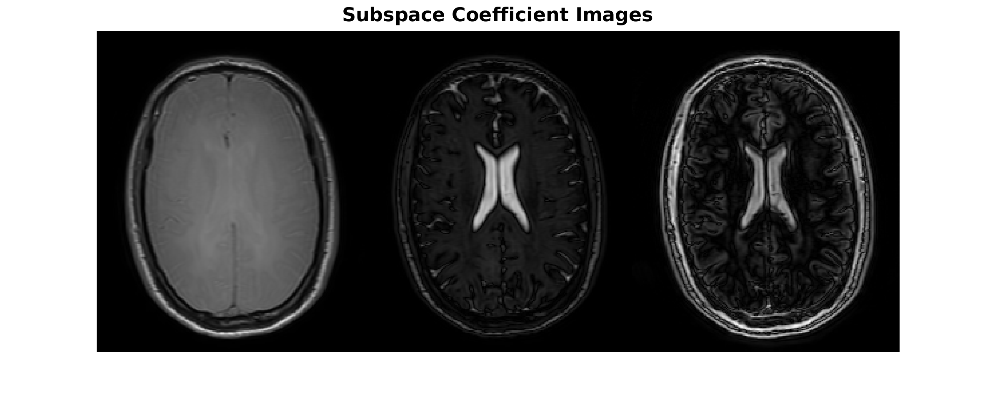

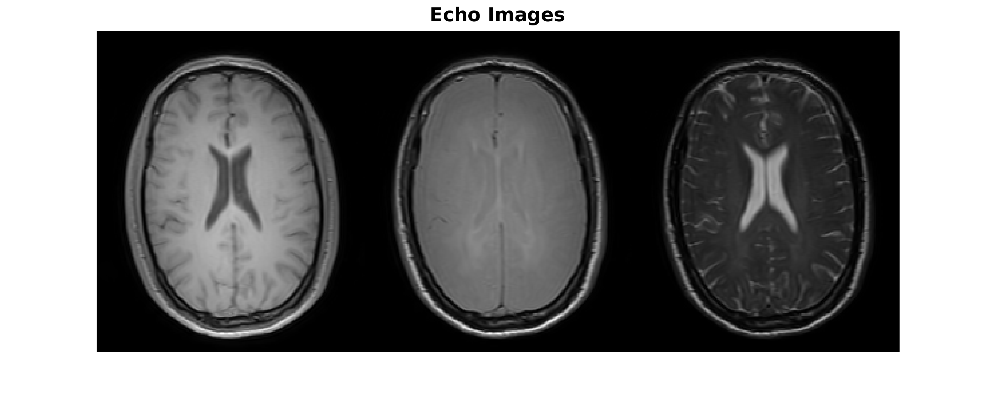

In [20]:
% view subspace coefficient images
figure(1), imshow([ squeeze(abs(alpha(:,:,view_slice,1))) 2*squeeze(abs(alpha(:,:,view_slice,2))) 15*squeeze(abs(alpha(:,:,view_slice,3))) ], [])
title('Subspace Coefficient Images')
% view echo time images
figure(2), imshow([ squeeze(abs(FS_dat_proj(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_proj(:,:,view_slice,10))) 2*squeeze(abs(FS_dat_proj(:,:,view_slice,28))) ], [])
title('Echo Images')

# For Simulation Figure 1:

Kvals =
     4     8    12    24


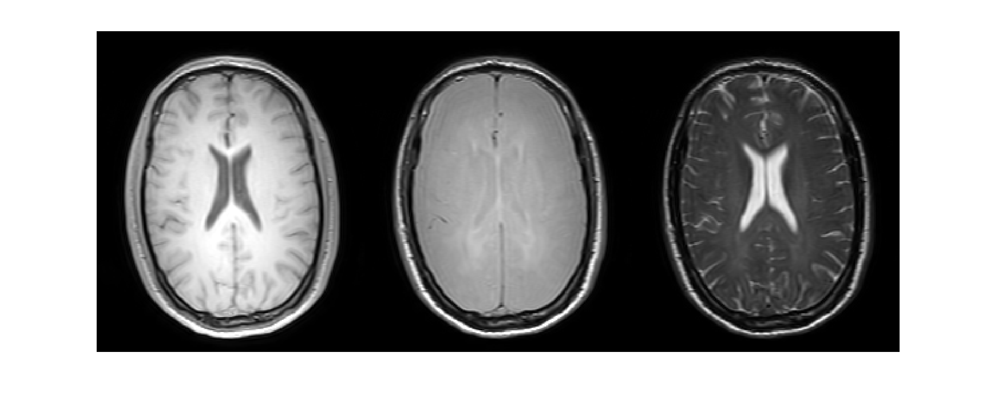

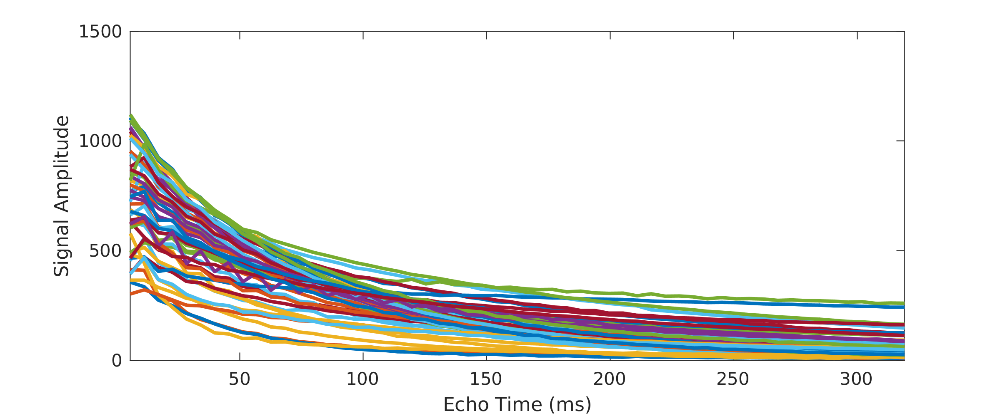

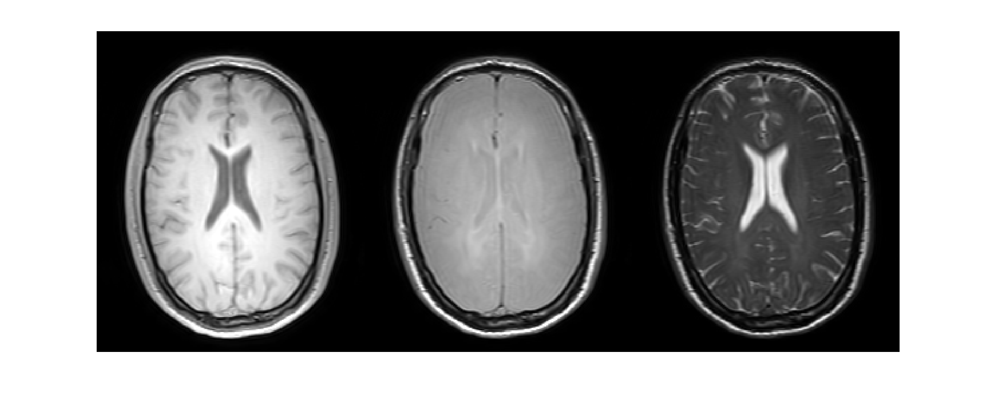

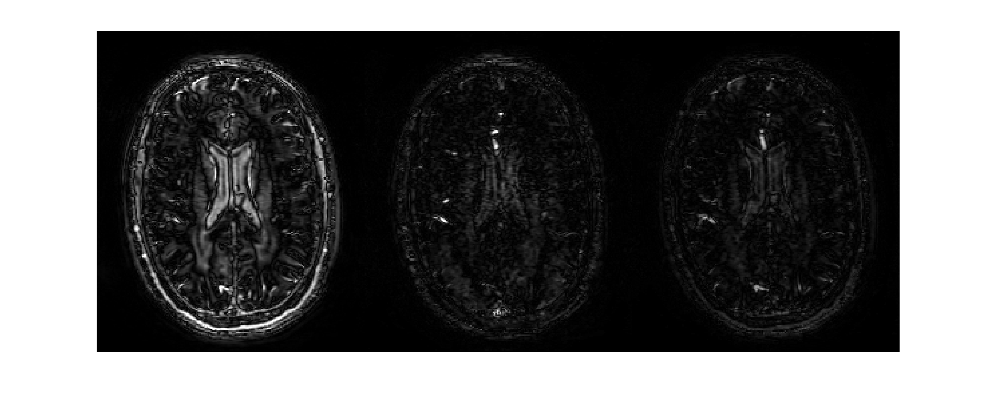

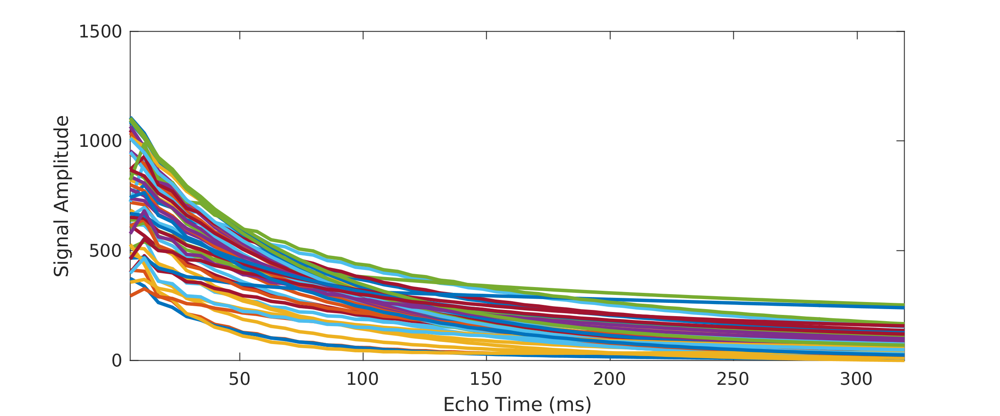

...

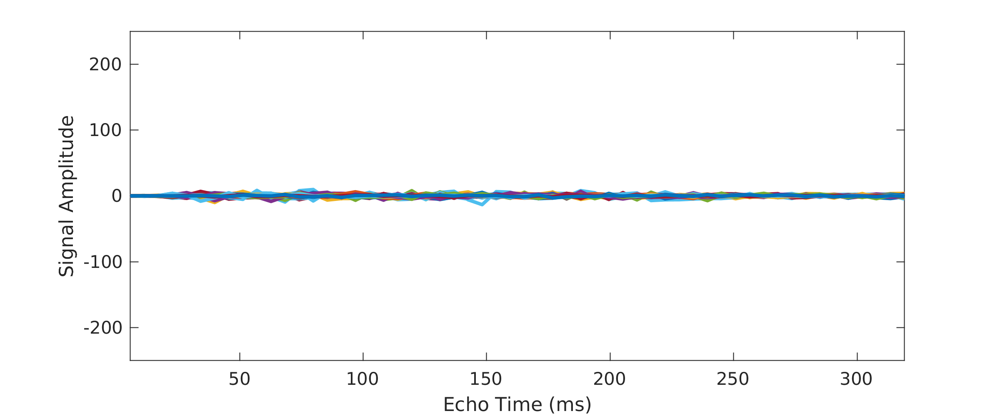

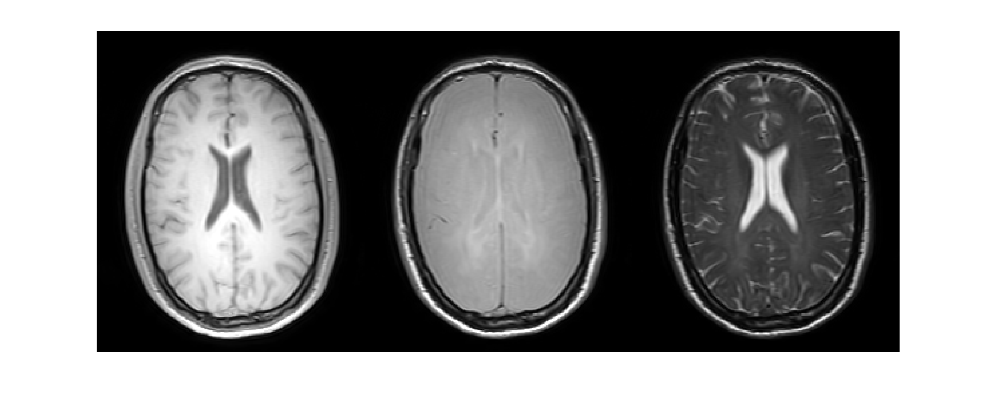

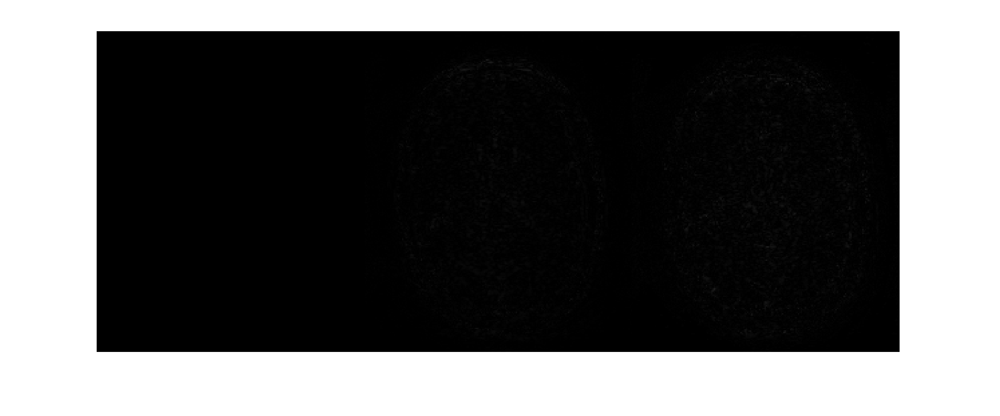

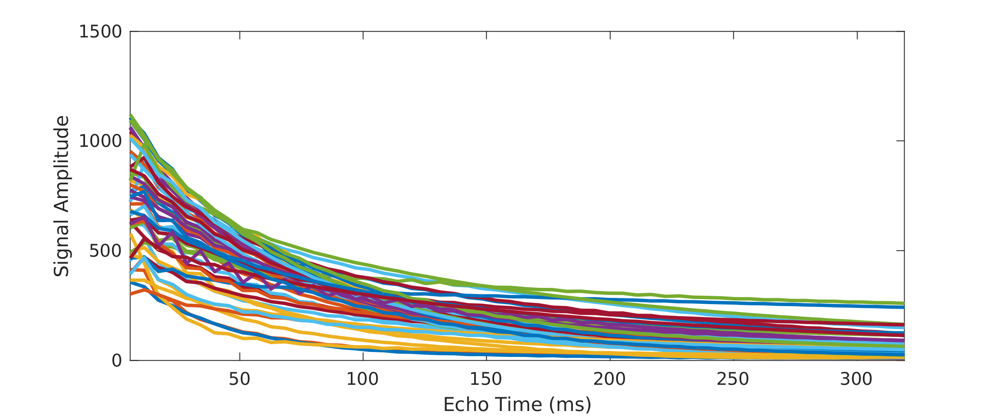

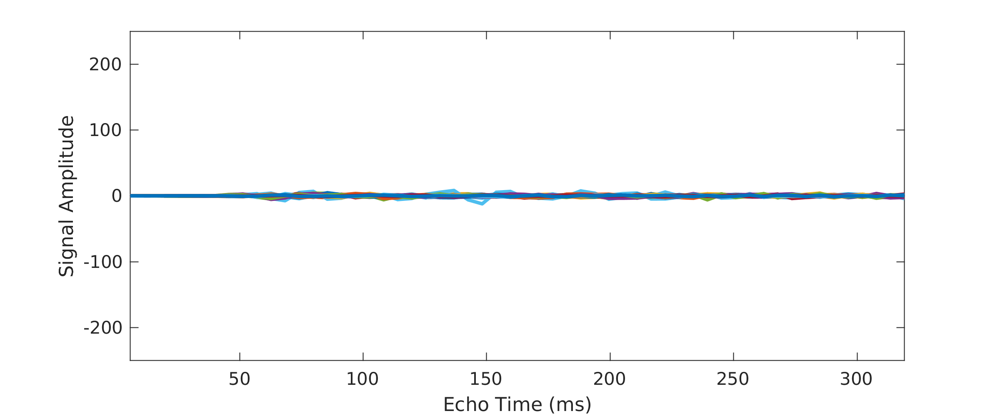

In [33]:
% Kvals = [ 1 2 3 4 5 6 8 12 24 ]
Kvals = [ 4 8 12 24 ]



% ----------------- Original images and signal
fig_i=2;
figure(fig_i-1), imshow([ squeeze(abs(FS_dat(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat(:,:,view_slice,10))) 2*squeeze(abs(FS_dat(:,:,view_slice,28))) ], imscale)
saveas(gcf,'SimulationResults/FS_dat_imgs.png')

figure(fig_i);
plot((1:nTE)*TE*1000, FS_dat_sig_evol(:,show), 'linewidth', 2);
xlim([TE*1000 TE*1000*nTE]);
ylim([0 1500]);
xlabel('Echo Time (ms)');
ylabel('Signal Amplitude');
% title('Original')
saveas(gcf,'SimulationResults/FS_dat_sig_evol.png')

% ----------------- LOOP   TEMPORAL BASIS SET / SUBSPACE -----------------
for K = Kvals
    
    Phi = FS_dat_basis(:,1:K);
    
    % ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
    
    % Project signal evolutions into subspace representation, then back to echo times
    FS_dat_sig_evol_proj = Phi*Phi'*FS_dat_sig_evol;
%     size(FS_dat_sig_evol_proj)

    % Project image data into subspace representation
    alpha = Phi' * reshape(FS_dat, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
    alpha = reshape(alpha.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,2));
%     size(alpha)

    % Project image data into subspace representation, then back to echo times
    FS_dat_proj = Phi * Phi' * reshape(FS_dat, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
    FS_dat_proj = reshape(FS_dat_proj.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,1));
%     size(FS_dat_proj)

    % ----------------- View images, residuals
    figure(fig_i+1), imshow([ squeeze(abs(FS_dat_proj(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_proj(:,:,view_slice,10))) 2*squeeze(abs(FS_dat_proj(:,:,view_slice,28))) ], imscale)
    saveas(gcf,[ 'SimulationResults/FS_dat_imgs_proj_K' num2str(K) '.png' ])
    
    FS_dat_proj_diff = FS_dat - FS_dat_proj;
    figure(fig_i+2), imshow([ squeeze(abs(FS_dat_proj_diff(:,:,view_slice,1))) squeeze(abs(FS_dat_proj_diff(:,:,view_slice,10))) squeeze(abs(FS_dat_proj_diff(:,:,view_slice,28))) ], imscale/20)
    saveas(gcf,[ 'SimulationResults/FS_dat_imgs_proj_K' num2str(K) '_resid.png' ])
    
    % ----------------- Plots
    
%     projected signal
    figure(fig_i+3);
    plot((1:nTE)*TE*1000, FS_dat_sig_evol_proj(:,show), 'linewidth', 2);
    xlim([TE*1000 TE*1000*nTE]);
    ylim([0 1500]);
    xlabel('Echo Time (ms)');
    ylabel('Signal Amplitude');
    % title('Original')
    saveas(gcf,[ 'SimulationResults/FS_dat_sig_evol_proj_K' num2str(K) '.png' ])

%     residuals from projected signal
    figure(fig_i+4);
    plot((1:nTE)*TE*1000, FS_dat_sig_evol(:,show)-FS_dat_sig_evol_proj(:,show), 'linewidth', 2);
    xlim([TE*1000 TE*1000*nTE]);
    ylim([-250 250]);
    xlabel('Echo Time (ms)');
    ylabel('Signal Amplitude');
    % title('Original')
    saveas(gcf,[ 'SimulationResults/FS_dat_sig_evol_proj_K' num2str(K) '_resid.png' ])

    fig_i = fig_i+4;

end
% ----------------- ENDLOOP   TEMPORAL BASIS SET / SUBSPACE -----------------

# For Simulation Figure 2:

In [22]:
Kvals = 1:56;
% Kvals = [ 3 8 12 ];

NRMSE_all = zeros(1,56);

% ----------------- LOOP   TEMPORAL BASIS SET / SUBSPACE -----------------
for K = Kvals
    Phi = FS_dat_basis(:,1:K);
    
    % ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
    % Project signal evolutions into subspace representation, then back to echo times
    FS_dat_sig_evol_proj = Phi*Phi'*FS_dat_sig_evol;
%     size(FS_dat_sig_evol_proj)

    % ----------------- CALCULATE NORMALIZED MODEL ERROR
    NRMSE = norm(FS_dat_sig_evol(:) - FS_dat_sig_evol_proj(:)) / norm(FS_dat_sig_evol(:));
%     bart('nrmse', FS_dat_sig_evol,FS_dat_sig_evol_proj) % equivalent
    
    NRMSE_all(K) = norm(FS_dat_sig_evol(:) - FS_dat_sig_evol_proj(:)) / norm(FS_dat_sig_evol(:));
end
% ----------------- ENDLOOP   TEMPORAL BASIS SET / SUBSPACE -----------------


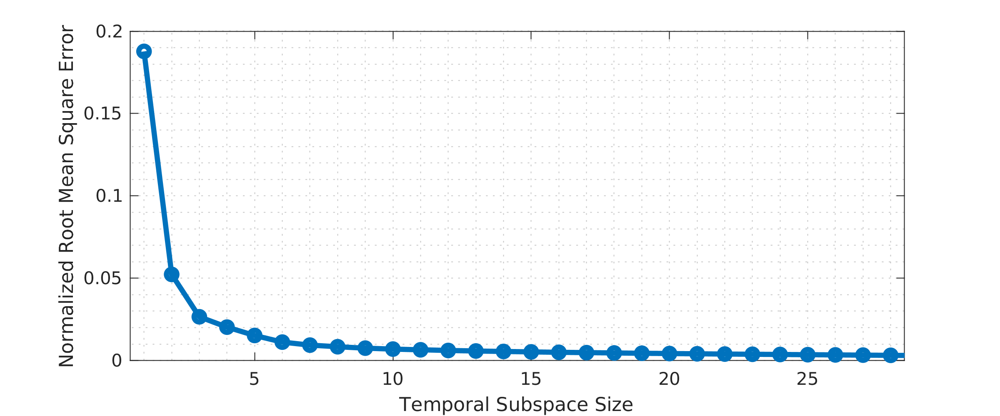

In [23]:
% NRMSE_all(56)

figure()
plot(1:29, NRMSE_all(1:29), 'o-', 'linewidth', 3);
grid minor
xlim([0.5, 28.5]);
% ylim([0,1])
xlabel('Temporal Subspace Size');
ylabel('Normalized Root Mean Square Error');
% saveas(gcf,[ './Figures/FS_dat_imgs_proj_K' num2str(K) '_resid.png' ])



# Now we calibrate a basis on data with added (temporally-incoherent) noise 

snr =
   500
noisevar =
  single
  1.1948e+03


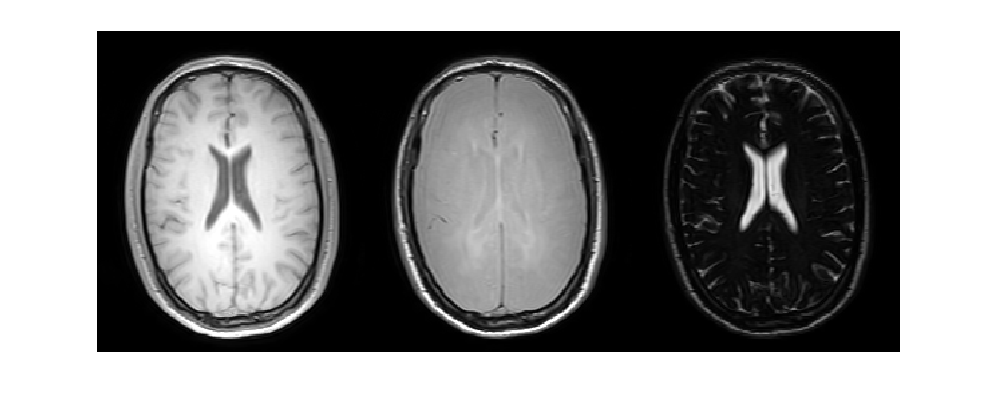

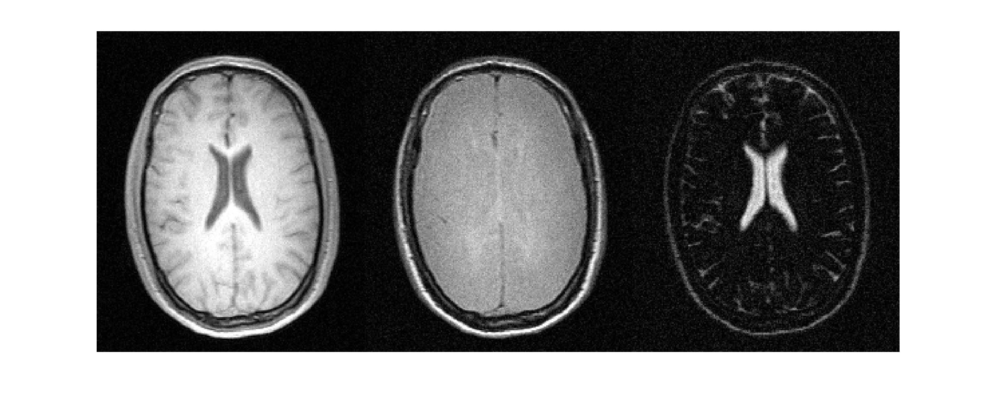

In [24]:
snr=500
% noisevar = mean(sig_evol_ALL(1,:))^2/snr
noisevar = mean(FS_dat_sig_evol(1,:))^2/snr

FS_dat_noisy = bart(['noise -r -n' num2str(noisevar)], FS_dat);

% figure(), imshow([ squeeze(abs(FS_dat(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat(:,:,view_slice,10))) 2*squeeze(abs(FS_dat(:,:,view_slice,56))); squeeze(abs(FS_dat_noisy(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_noisy(:,:,view_slice,10))) 2.0*squeeze(abs(FS_dat_noisy(:,:,view_slice,56)))], imscale)
figure(1), imshow([ squeeze(abs(FS_dat(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat(:,:,view_slice,10))) 2*squeeze(abs(FS_dat(:,:,view_slice,56)))], imscale)
saveas(gcf,[ 'SimulationResults/FS_dat_imgs.png' ])

figure(2), imshow([ squeeze(abs(FS_dat_noisy(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_noisy(:,:,view_slice,10))) 2.0*squeeze(abs(FS_dat_noisy(:,:,view_slice,56)))], imscale)
saveas(gcf,[ 'SimulationResults/FS_dat_noisy_imgs_snr' num2str(snr) '.png' ])

Length sig_evol < maxN)
Done Basis Set Calibration 


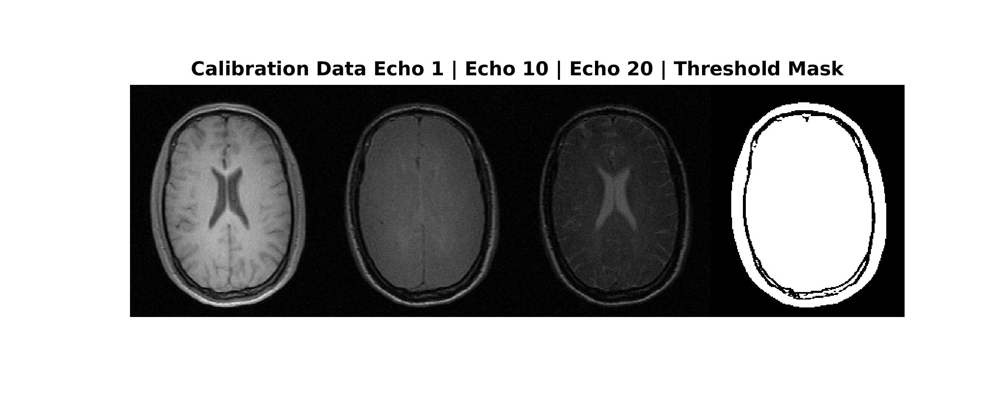

In [25]:

% ----------------- CREATE SIGNAL EVOLUTION MATRIX with column of all echo times, column of all voxels 
clear iflat_ALL_noisy
iflat_ALL_noisy = reshape(FS_dat_noisy, size(FS_dat_noisy,1)*size(FS_dat_noisy,2)*size(FS_dat_noisy,3),size(FS_dat_noisy,4));
% ----------------- 

% ----------------- remove threshold voxels (using previous threshold, to include idential voxels)
iflat_ALL_noisy = iflat_ALL_noisy(thresh_indices,:);
% size(iflat_ALL)

sig_evol_ALL = permute(iflat_ALL_noisy, [ 2 1 ]); % rearrange for SVD
% size(sig_evol_ALL)

if show_threshold == 1
    figure(), imshow([ squeeze(abs(FS_dat_noisy(:,:,view_slice,1))) squeeze(abs(FS_dat_noisy(:,:,view_slice,10))) squeeze(abs(FS_dat_noisy(:,:,view_slice,20))) 1000*squeeze(abs(thresh_img(:,:,view_slice))) ], [ 0 1*max(max(abs(FS_dat_noisy(:,:,view_slice,1)))) ],'InitialMagnification','fit');
    title('Calibration Data Echo 1 | Echo 10 | Echo 20 | Threshold Mask')
%     print('calibration_threshold_mask', '-dpng', '-r300');
end

% ----------------- if more than maxN are given, randomly choose
if length(iflat_ALL_noisy) > maxN
%     idx = randperm(length(iflat_ALL));
    iflat_maxN = iflat_ALL_noisy(idx(1:maxN),:);
    % maxN and ALL are separate
    sig_evol = permute(iflat_maxN, [ 2 1 ]); % maxN and ALL are different
    disp('Length sig_evol > maxN)')
else
    sig_evol = permute(iflat_ALL_noisy, [ 2 1 ]); % maxN and ALL are the same
    disp('Length sig_evol < maxN)')
end

% % ----------------- smaller number just for display
% iflat_maxN_disp = iflat_ALL(idx_disp(1:maxN_disp),:);
% sig_evol_disp = permute(iflat_maxN_disp, [ 2 1 ]);

% ----------------- SVD
% doc svd()
% X is size (echo train length , number of signal evolutions)
[basis, ~, ~] = svd(abs(sig_evol), 'econ'); % COMPLEX MAGNITUDE
disp('Done Basis Set Calibration ')

% ----------------- Save
FS_dat_noisy_sig_evol = sig_evol;
FS_dat_noisy_basis = basis;
save('SimulationResults/FS_dat_noisy_sig_evol_basis.mat', 'FS_dat_noisy_sig_evol', 'FS_dat_noisy_basis'); 

% size(sig_evol,2)

# Compare subspace from clean and noisy calibration

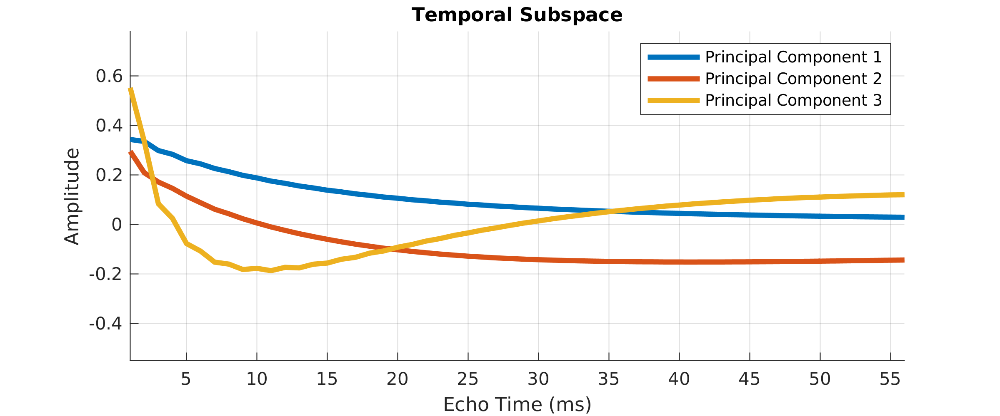

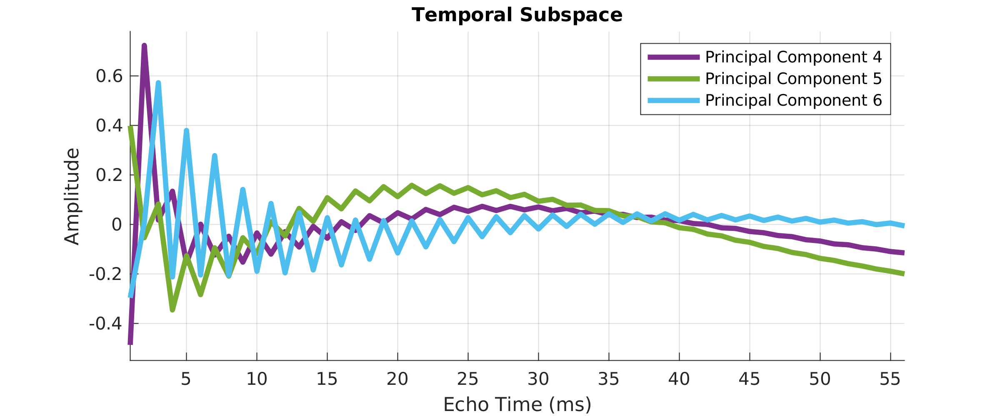

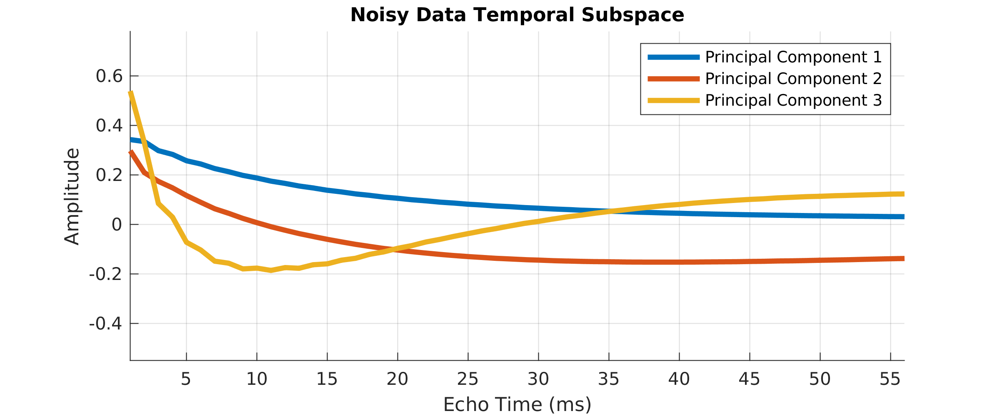

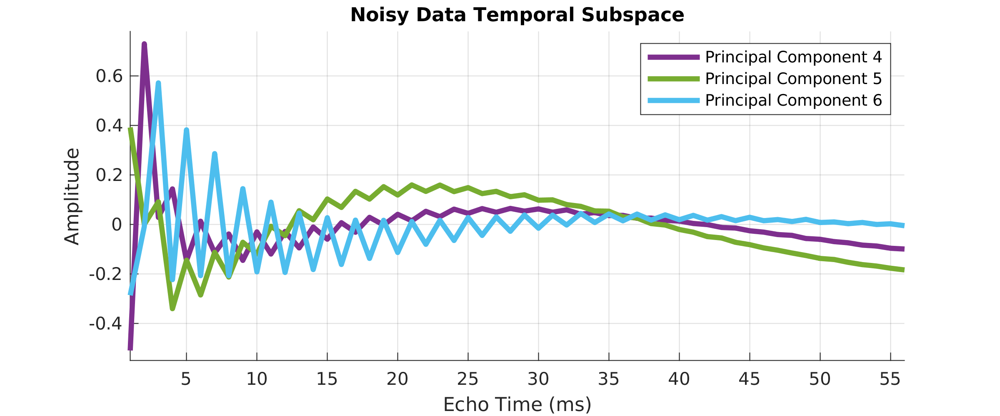

In [28]:
colorstring = [0 0.4470 0.7410; 0.8500 0.3250 0.0980; 0.9290 0.6940 0.1250; 0.4940 0.1840 0.5560; 0.4660 0.6740 0.1880; 0.3010 0.7450 0.9330];
% size(colorstring)


Phi_disp = FS_dat_basis;

% sign is arbitrary, swap sign where needed to make more easily comparable between original/noisy cases
Phi_disp(:,1:2) = -Phi_disp(:,1:2);
Phi_disp(:,5:6) = -Phi_disp(:,5:6);

figure(1);
hold on
for i = 1:3
    plot(Phi_disp(:,i), 'linewidth', 3, 'Color', colorstring(i,:));
end
grid on
hold off
xlabel('Echo Time (ms)');
legend({'Principal Component 1','Principal Component 2','Principal Component 3'}); %,'Principal Component 4','Principal Component 5','Principal Component 6'});
ylabel('Amplitude');
xlim([1 56]);
ylim([-0.55 0.78]);
title({'Temporal Subspace'})
saveas(gcf,'SimulationResults/FS_dat_basis_123.png')


figure(2);
hold on
for i = 4:6
    plot(Phi_disp(:,i), 'linewidth', 3, 'Color', colorstring(i,:));
end
grid on
hold off
xlabel('Echo Time (ms)');
legend({'Principal Component 4','Principal Component 5','Principal Component 6'});
ylabel('Amplitude');
xlim([1 56]);
ylim([-0.55 0.78]);
title({'Temporal Subspace'})
saveas(gcf,'SimulationResults/FS_dat_basis_456.png')


Phi_disp = FS_dat_noisy_basis;

% sign is arbitrary, swap sign where needed to make more easily comparable
Phi_disp(:,1:2) = -Phi_disp(:,1:2);
% Phi_disp(:,4) = -Phi_disp(:,4);

figure(3);
hold on
for i = 1:3
    plot(Phi_disp(:,i), 'linewidth', 3, 'Color', colorstring(i,:));
end
grid on
hold off
xlabel('Echo Time (ms)');
legend({'Principal Component 1','Principal Component 2','Principal Component 3'}); %,'Principal Component 4','Principal Component 5','Principal Component 6'});
ylabel('Amplitude');
xlim([1 56]);
ylim([-0.55 0.78]);
title({'Noisy Data Temporal Subspace'})
saveas(gcf,['SimulationResults/FS_dat_noisy_snr' num2str(snr) '_basis_123.png'])


figure(4);
hold on
for i = 4:6
    plot(Phi_disp(:,i), 'linewidth', 3, 'Color', colorstring(i,:));
end
grid on
hold off
xlabel('Echo Time (ms)');
legend({'Principal Component 4','Principal Component 5','Principal Component 6'});
ylabel('Amplitude');
xlim([1 56]);
ylim([-0.55 0.78]);
title({'Noisy Data Temporal Subspace'})
saveas(gcf,['SimulationResults/FS_dat_noisy_snr' num2str(snr) '_basis_456.png'])



# Compare NRMSE of original signals from original vs noisy calibrated subspace projections

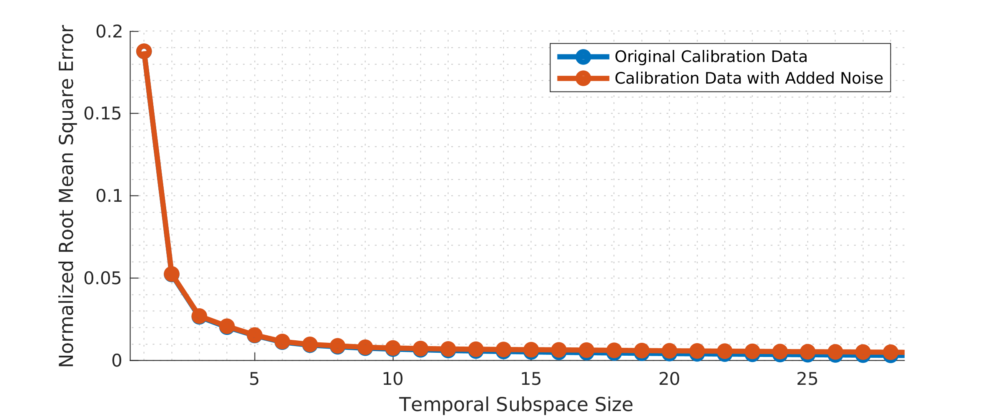

In [35]:
Kvals = 1:56;
% Kvals = [ 3 8 12 ];

NRMSE_noisy_all = zeros(1,56);

% ----------------- LOOP   TEMPORAL BASIS SET / SUBSPACE -----------------
for K = Kvals
    Phi = FS_dat_noisy_basis(:,1:K);
    % ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
    % Project signal evolutions into subspace representation, then back to echo times
    FS_dat_sig_evol_proj = Phi*Phi'*FS_dat_sig_evol;
    % ----------------- CALCULATE NORMALIZED MODEL ERROR
    NRMSE_noisy_all(K) = norm(FS_dat_sig_evol(:) - FS_dat_sig_evol_proj(:)) / norm(FS_dat_sig_evol(:));
end
% ----------------- ENDLOOP   TEMPORAL BASIS SET / SUBSPACE -----------------

figure()
hold on
plot(1:29, NRMSE_all(1:29), 'o-', 'linewidth', 3);
plot(1:29, NRMSE_noisy_all(1:29), 'o-', 'linewidth', 3);
hold off
legend({'Original Calibration Data','Calibration Data with Added Noise'});
grid minor
xlim([0.5, 28.5]);
% ylim([0,1])
xlabel('Temporal Subspace Size');
ylabel('Normalized Root Mean Square Error');
% saveas(gcf,[ 'SimulationResults/FS_dat_imgs_proj_K' num2str(K) '_resid.png' ])

# Compare NRMSE of noisy signals from original vs noisy calibrated subspace projections

In [38]:
Kvals = 1:56;
% Kvals = [ 3 8 12 ];


% ----------------- LOOP   TEMPORAL BASIS SET / SUBSPACE -----------------
NRMSE_noisy_basisANDsignal_all = zeros(1,56);
for K = Kvals
    Phi = FS_dat_noisy_basis(:,1:K);
    % ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
    % Project signal evolutions into subspace representation, then back to echo times
    FS_dat_noisy_sig_evol_proj = Phi*Phi'*FS_dat_noisy_sig_evol;
    % ----------------- CALCULATE NORMALIZED MODEL ERROR
    NRMSE_noisy_basisANDsignal_all(K) = norm(FS_dat_sig_evol(:) - FS_dat_noisy_sig_evol_proj(:)) / norm(FS_dat_sig_evol(:));
end
% ----------------- ENDLOOP   TEMPORAL BASIS SET / SUBSPACE -----------------

figure()
hold on
plot(1:29, NRMSE_all(1:29), 'o-', 'linewidth', 3);
plot(1:29, NRMSE_noisy_basisANDsignal_all(1:29), 'o-', 'linewidth', 3);
hold off
legend({'Original','Noisy'});
grid minor
xlim([0.5, 28.5]);
% ylim([0,0.22])
ylim([0,0.3])
xlabel('Temporal Subspace Size');
ylabel('Normalized Root Mean Square Error');
saveas(gcf,['SimulationResults/FS_dat_orig_vs_noisy_nrmse_snr' num2str(snr) '.png'])

ans =
          56     1031251
ans =
          56     1031251


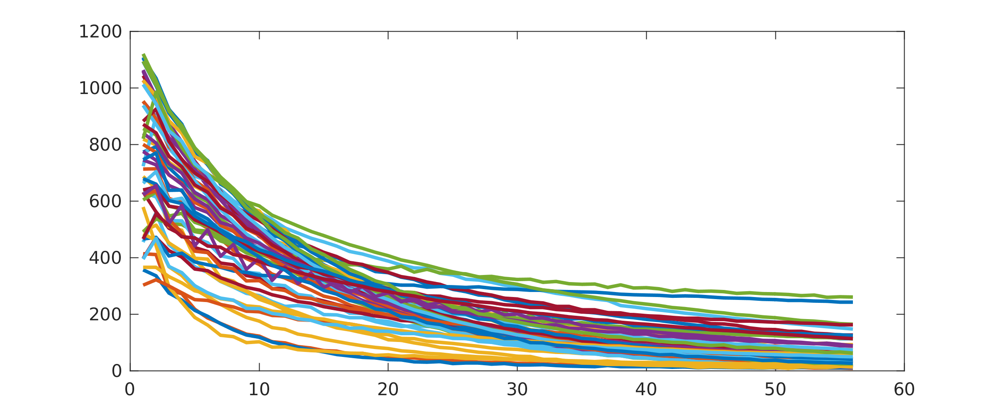

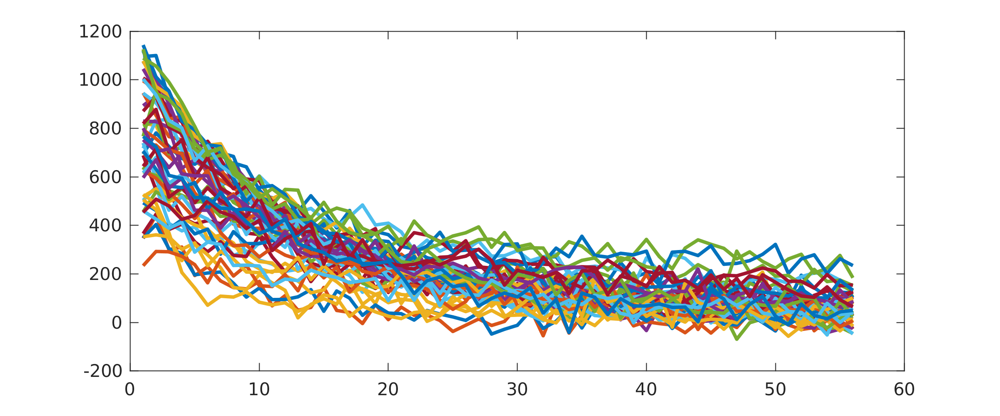

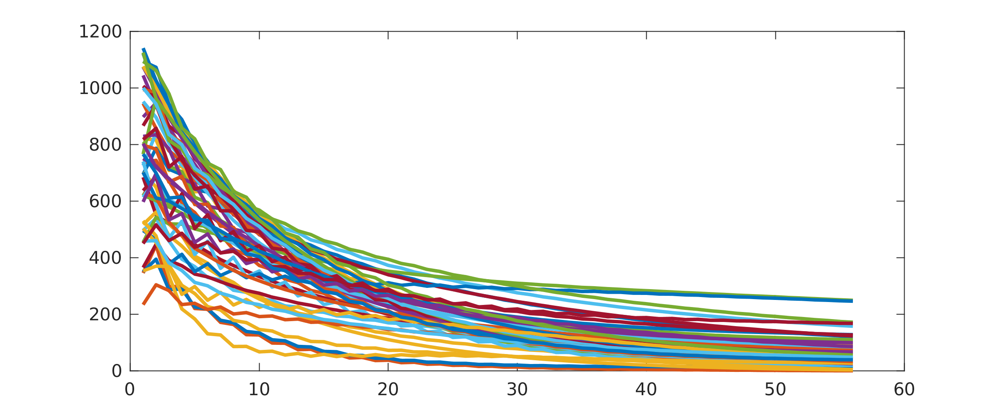

In [30]:
size(FS_dat_sig_evol)
size(FS_dat_noisy_sig_evol)


K = 6;
% Kvals = [ 3 8 12 ];

Phi = FS_dat_noisy_basis(:,1:K);
% ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
% Project signal evolutions into subspace representation, then back to echo times
FS_dat_noisy_sig_evol_proj = Phi*Phi'*FS_dat_noisy_sig_evol;


figure(1)
plot(1:56, FS_dat_sig_evol(:,show), 'linewidth', 2);
figure(2)
plot(1:56, FS_dat_noisy_sig_evol(:,show), 'linewidth', 2);
figure(3)
plot(1:56, FS_dat_noisy_sig_evol_proj(:,show), 'linewidth', 2);
% size(FS_dat_sig_evol)
% size(FS_dat_noisy_sig_evol_proj)

# Examine residuals of noisy signal for various subspace sizes

Kvals =
     4     8    12    24    56


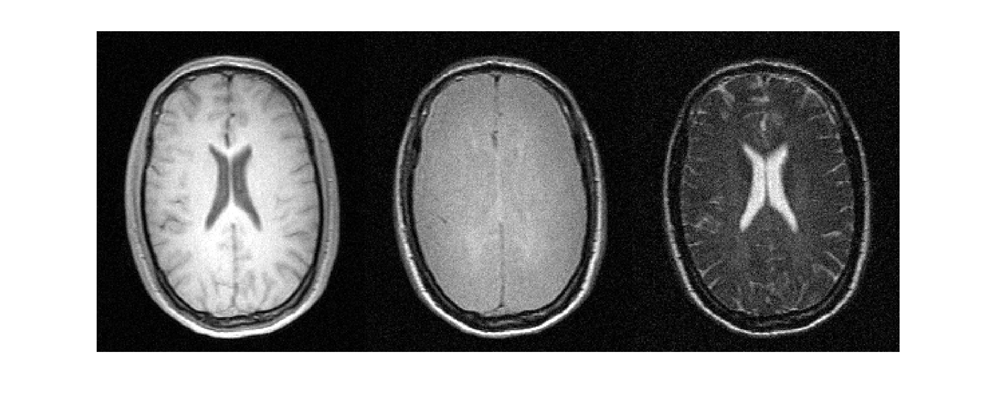

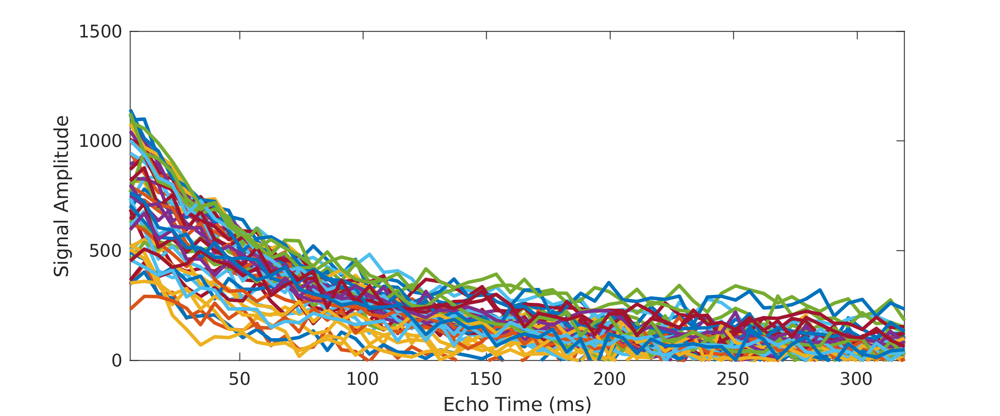

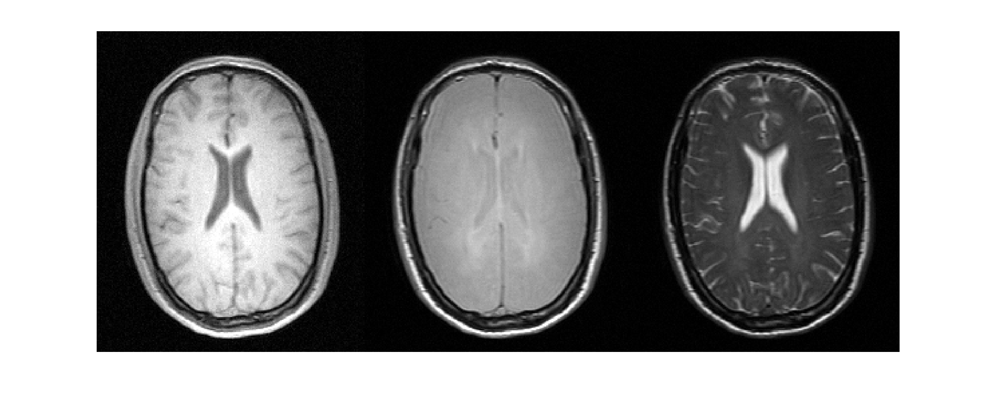

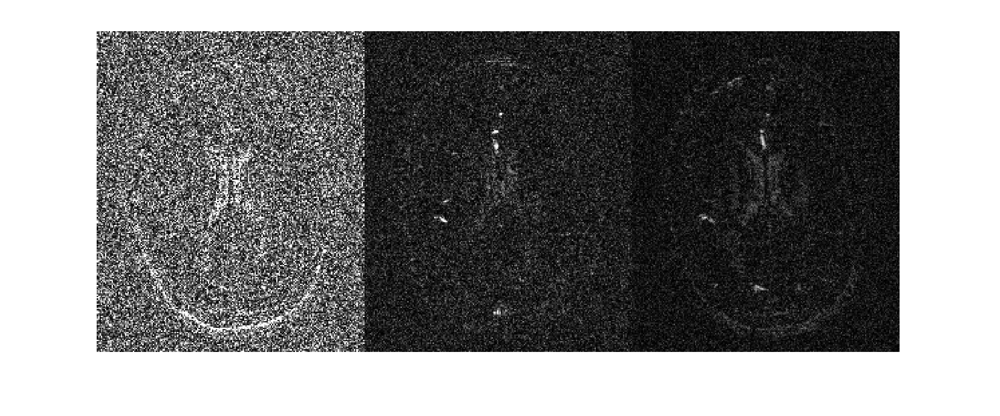

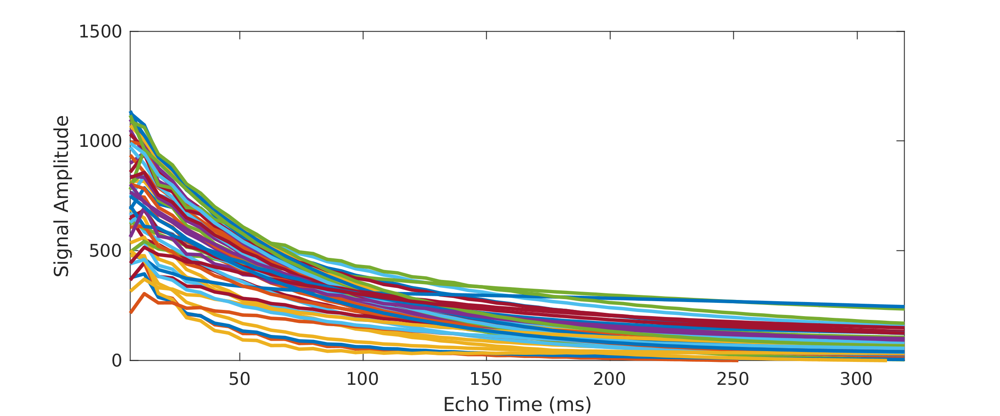

...

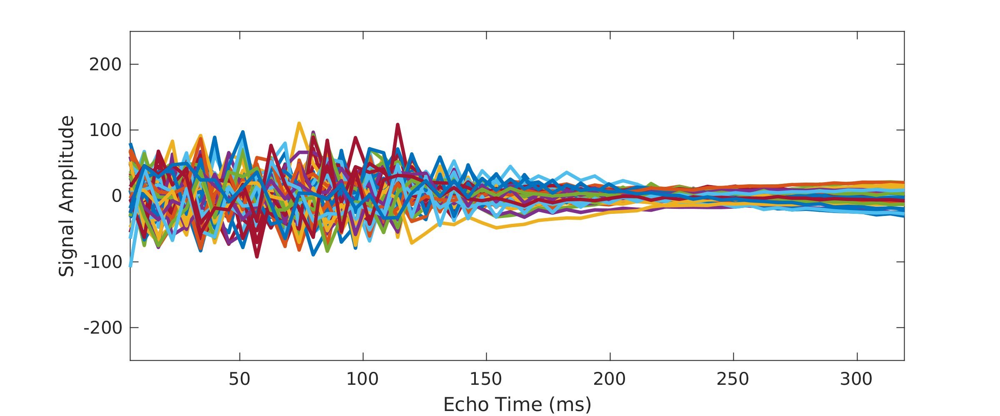

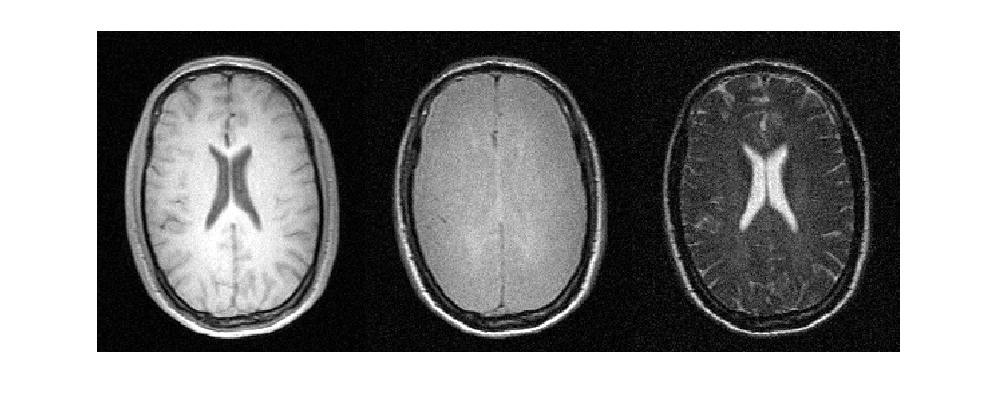

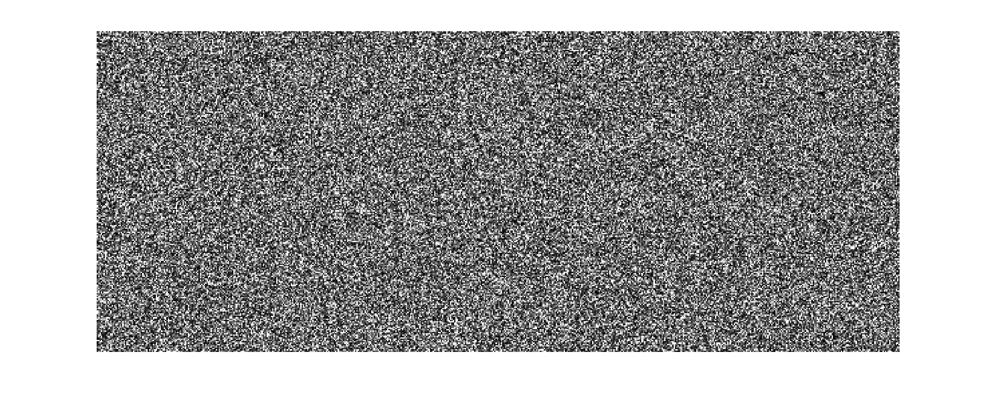

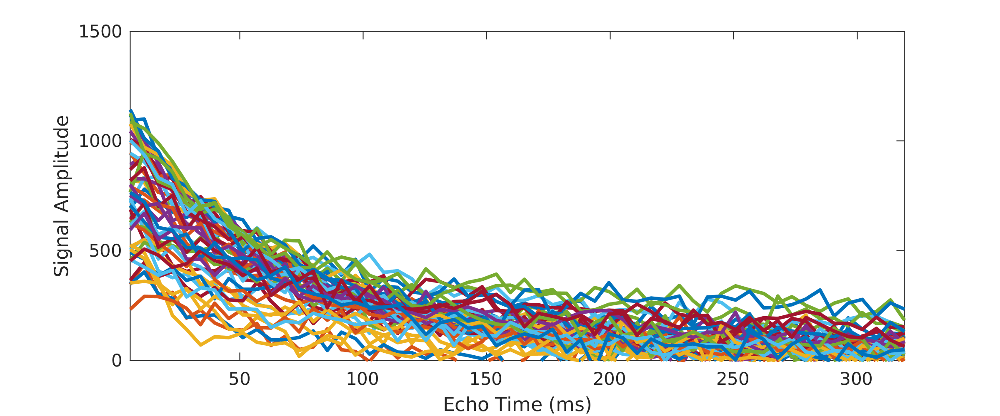

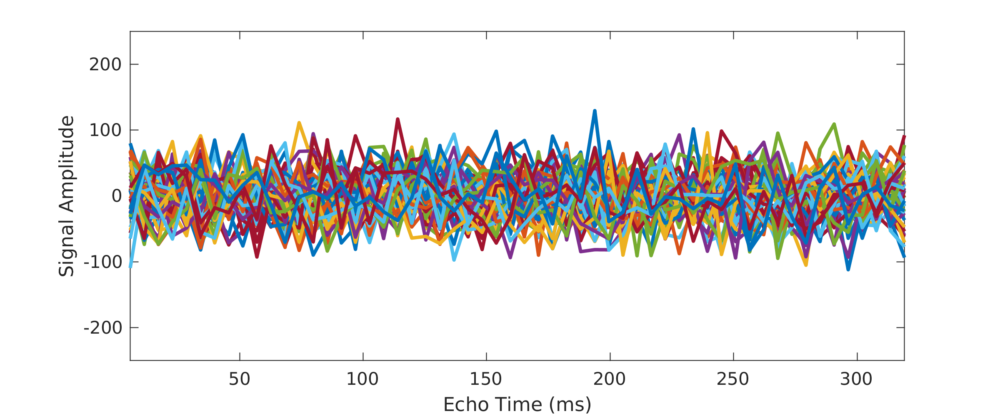

In [32]:
% Kvals = [ 1 2 3 4 5 6 8 12 24 56 ]
Kvals = [ 4 8 12 24 56 ]


% ----------------- Original images and signal
fig_i=2;
figure(fig_i-1), imshow([ squeeze(abs(FS_dat_noisy(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_noisy(:,:,view_slice,10))) 2*squeeze(abs(FS_dat_noisy(:,:,view_slice,28))) ], imscale)
saveas(gcf,['SimulationResults/FS_dat_noisy_snr' num2str(snr) '_imgs.png'])

figure(fig_i);
plot((1:nTE)*TE*1000, FS_dat_noisy_sig_evol(:,show), 'linewidth', 2);
xlim([TE*1000 TE*1000*nTE]);
ylim([0 1500]);
xlabel('Echo Time (ms)');
ylabel('Signal Amplitude');
% title('Original')
saveas(gcf,['SimulationResults/FS_dat_noisy_snr' num2str(snr) '_sig_evol.png'])

% ----------------- LOOP   TEMPORAL BASIS SET / SUBSPACE -----------------
for K = Kvals
    
    Phi = FS_dat_noisy_basis(:,1:K);
    
    % ----------------- PROJECT SIGNAL EVOLUTIONS ONTO EACH SUBSPACE
    
    % Project signal evolutions into subspace representation, then back to echo times
    FS_dat_noisy_sig_evol_proj = Phi*Phi'*FS_dat_noisy_sig_evol;
%     size(FS_dat_sig_evol_proj)

    % Project image data into subspace representation
    alpha = Phi' * reshape(FS_dat_noisy, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
    alpha = reshape(alpha.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,2));
%     size(alpha)

    % Project image data into subspace representation, then back to echo times
    FS_dat_noisy_proj = Phi * Phi' * reshape(FS_dat_noisy, size(FS_dat,1)*size(FS_dat,2)*size(FS_dat,3),size(Phi,1)).';
    FS_dat_noisy_proj = reshape(FS_dat_noisy_proj.', size(FS_dat,1), size(FS_dat,2), size(FS_dat,3), size(Phi,1));
%     size(FS_dat_proj)

    % ----------------- View images, residuals
    figure(fig_i+1), imshow([ squeeze(abs(FS_dat_noisy_proj(:,:,view_slice,1))) 1.5*squeeze(abs(FS_dat_noisy_proj(:,:,view_slice,10))) 2*squeeze(abs(FS_dat_noisy_proj(:,:,view_slice,28))) ], imscale)
    saveas(gcf,[ 'SimulationResults/FS_dat_noisy_snr' num2str(snr) '_imgs_proj_K' num2str(K) '.png' ])
    
    FS_dat_noisy_proj_diff = FS_dat - FS_dat_noisy_proj;
    figure(fig_i+2), imshow([ squeeze(abs(FS_dat_noisy_proj_diff(:,:,view_slice,1))) squeeze(abs(FS_dat_noisy_proj_diff(:,:,view_slice,10))) squeeze(abs(FS_dat_noisy_proj_diff(:,:,view_slice,28))) ], imscale/20)
    saveas(gcf,[ 'SimulationResults/FS_dat_noisy_snr' num2str(snr) '_imgs_proj_K' num2str(K) '_resid.png' ])
    
    % ----------------- Plots
    
%     projected signal
    figure(fig_i+3);
    plot((1:nTE)*TE*1000, FS_dat_noisy_sig_evol_proj(:,show), 'linewidth', 2);
    xlim([TE*1000 TE*1000*nTE]);
    ylim([0 1500]);
    xlabel('Echo Time (ms)');
    ylabel('Signal Amplitude');
    % title('Original')
    saveas(gcf,[ 'SimulationResults/FS_dat_noisy_snr' num2str(snr) '_sig_evol_proj_K' num2str(K) '.png' ])

%     residuals from projected signal
    figure(fig_i+4);
    plot((1:nTE)*TE*1000, FS_dat_sig_evol(:,show)-FS_dat_noisy_sig_evol_proj(:,show), 'linewidth', 2);
    xlim([TE*1000 TE*1000*nTE]);
    ylim([-250 250]);
    xlabel('Echo Time (ms)');
    ylabel('Signal Amplitude');
    % title('Original')
    saveas(gcf,[ 'SimulationResults/FS_dat_noisy_snr' num2str(snr) '_sig_evol_proj_K' num2str(K) '_resid.png' ])

    fig_i = fig_i+4;

end
% ----------------- ENDLOOP   TEMPORAL BASIS SET / SUBSPACE -----------------